<a href="https://colab.research.google.com/github/m2kanodi/Montreal_theft/blob/main/Theft_montreal_predict.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import libraries
import numpy as np
import pandas as pd
import geopandas
import shapely.geometry
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
from sklearn.model_selection import train_test_split
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder

In [3]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
file1_path = '/content/drive/My Drive/actes-criminels.csv'
file2_path = '/content/drive/My Drive/types_of_places.csv'

actes  = pd.read_csv(file1_path)
types = pd.read_csv(file2_path)
# df3 = pd.read_csv(file3_path)


In [7]:
actes

,CATEGORIE,DATE,QUART,PDQ,X,Y,LONGITUDE,LATITUDE
0,Vol de véhicule à moteur,2018-09-13,jour,30.0,294904.159001,5.047549e+06,-73.626778,45.567780
1,Vol de véhicule à moteur,2018-04-30,jour,30.0,294904.159001,5.047549e+06,-73.626778,45.567780
2,Vol de véhicule à moteur,2018-09-01,nuit,7.0,290274.565000,5.042150e+06,-73.685928,45.519122
3,Méfait,2017-07-21,jour,21.0,NaN,NaN,NaN,NaN
4,Méfait,2017-07-29,jour,12.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
247776,Méfait,2023-01-25,nuit,5.0,282322.244000,5.038093e+06,-73.787533,45.482397
247777,Vol de véhicule à moteur,2023-01-25,nuit,27.0,NaN,NaN,NaN,NaN
247778,Vol dans / sur véhicule à moteur,2023-01-25,nuit,7.0,287693.613000,5.040649e+06,-73.718913,45.505551
247779,Infractions entrainant la mort,2023-01-25,nuit,22.0,300219.661995,5.043573e+06,-73.558643,45.532059


In [8]:
# Rename columns
translations = {'CATEGORIE': "CATEGORY", 'QUART': "TIME OF DAY", 'Introduction': "Breaking/Entering", "Vol dans / sur véhicule à moteur": "Theft from/to Vehicle", 'Vol de véhicule à moteur': 'Theft of Vehicle', "Méfait": "Mischief", "Vols qualifiés": "Robbery", "Infractions entrainant la mort": "Murder", "jour": "Day", "soir": "Evening", "nuit": "Night"}
actes = actes.rename(columns=translations)
actes['CATEGORY'] = actes['CATEGORY'].replace(translations)
actes['TIME OF DAY'] = actes['TIME OF DAY'].replace(translations)

In [9]:
actes

,CATEGORY,DATE,TIME OF DAY,PDQ,X,Y,LONGITUDE,LATITUDE
0,Theft of Vehicle,2018-09-13,Day,30.0,294904.159001,5.047549e+06,-73.626778,45.567780
1,Theft of Vehicle,2018-04-30,Day,30.0,294904.159001,5.047549e+06,-73.626778,45.567780
2,Theft of Vehicle,2018-09-01,Night,7.0,290274.565000,5.042150e+06,-73.685928,45.519122
3,Mischief,2017-07-21,Day,21.0,NaN,NaN,NaN,NaN
4,Mischief,2017-07-29,Day,12.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
247776,Mischief,2023-01-25,Night,5.0,282322.244000,5.038093e+06,-73.787533,45.482397
247777,Theft of Vehicle,2023-01-25,Night,27.0,NaN,NaN,NaN,NaN
247778,Theft from/to Vehicle,2023-01-25,Night,7.0,287693.613000,5.040649e+06,-73.718913,45.505551
247779,Murder,2023-01-25,Night,22.0,300219.661995,5.043573e+06,-73.558643,45.532059


In [10]:
expanded_date = actes.apply(lambda x: x['DATE'].split('-'), result_type='expand', axis=1)
expanded_date.columns = ['YEAR', 'MONTH', 'DAY']
actes['MONTH'] = expanded_date['MONTH']
actes = actes.drop(columns=['DATE', 'X', 'Y'])
actes = actes.dropna(axis=0)
actes['TYPE'] = types['TYPE']
# pd.concat([actes, pd.get_dummies(actes['TYPE'])])
actes['TYPE'] = actes['TYPE'].astype('category')
actes['TIME OF DAY'] = actes['TIME OF DAY'].astype('category')
actes['MONTH'] = actes['MONTH'].astype('float64')
actes['CATEGORY'] = actes['CATEGORY'].astype('category')

In [11]:
categories = {'Breaking/Entering': 0, 'Theft from/to Vehicle': 1, 'Theft of Vehicle': 2, 'Mischief': 3, 'Robbery': 4, 'Murder':5}

In [12]:
X = actes.drop('CATEGORY', axis=1)
y = actes['CATEGORY'].apply(lambda x: categories[x])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [ ]:
model = XGBClassifier(enable_categorical=True, tree_method='approx')
params = {
    'learning_rate': [0.1],
    'min_child_weight': [0.2, 0.5, 1, 3, 5],
    'gamma': [0.2, 0.5, 1, 1.8, 3, 5],
    'subsample': [0.5, 0.7, 0.9],
    'colsample_bytree': [0.7, 0.9],
    'max_depth': [1, 3, 5, 7]
    }
comb = 32
folds = 20
kf = KFold(n_splits=folds, shuffle=True, random_state=1001)
search = RandomizedSearchCV(model, param_distributions=params, n_iter=comb, cv=kf.split(X,y), verbose=5)
search.fit(X, y)

Fitting 20 folds for each of 32 candidates, totalling 640 fits
[CV 1/20] END colsample_bytree=0.9, gamma=1.8, learning_rate=0.1, max_depth=5, min_child_weight=3, subsample=0.5;, score=0.378 total time= 1.1min
[CV 2/20] END colsample_bytree=0.9, gamma=1.8, learning_rate=0.1, max_depth=5, min_child_weight=3, subsample=0.5;, score=0.385 total time= 1.0min
[CV 3/20] END colsample_bytree=0.9, gamma=1.8, learning_rate=0.1, max_depth=5, min_child_weight=3, subsample=0.5;, score=0.375 total time= 1.0min
[CV 4/20] END colsample_bytree=0.9, gamma=1.8, learning_rate=0.1, max_depth=5, min_child_weight=3, subsample=0.5;, score=0.375 total time= 1.1min
[CV 5/20] END colsample_bytree=0.9, gamma=1.8, learning_rate=0.1, max_depth=5, min_child_weight=3, subsample=0.5;, score=0.376 total time= 1.1min
[CV 6/20] END colsample_bytree=0.9, gamma=1.8, learning_rate=0.1, max_depth=5, min_child_weight=3, subsample=0.5;, score=0.373 total time= 1.1min
[CV 7/20] END colsample_bytree=0.9, gamma=1.8, learning_rate=

In [1]:
# Pip install
!pip install translate
!pip install shapely

In [2]:
# Import libraries
import json
import numpy as np
import pandas as pd
import geopandas
import shapely.geometry
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from pathlib import Path
from datetime import datetime, timedelta

In [5]:
actes

actes.describe()

,PDQ,X,Y,LONGITUDE,LATITUDE
count,247776.000000,205753.000000,2.057530e+05,205753.000000,205753.000000
mean,26.309610,295794.035138,5.043223e+06,-73.615263,45.528836
std,14.029531,6083.008112,6.068889e+03,0.077786,0.054660
min,1.000000,268109.610010,5.029291e+06,-73.968954,45.402691
25%,15.000000,293900.976994,5.039088e+06,-73.639550,45.491491
50%,26.000000,297338.250001,5.042868e+06,-73.595562,45.525665
75%,39.000000,299665.903993,5.047185e+06,-73.565752,45.564512
max,55.000000,306389.863000,5.062496e+06,-73.479583,45.702351


In [7]:
file4_path = '/content/drive/My Drive/limitespdq (1).geojson'
limit_df = geopandas.read_file(file4_path)

In [9]:
limit_df

,PDQ,NOM_PDQ,geometry
0,1,PDQ-1,"MULTIPOLYGON (((-73.84050 45.45690, -73.84220 ..."
1,3,PDQ-3,"MULTIPOLYGON (((-73.93970 45.47010, -73.93980 ..."
2,4,PDQ-4,"MULTIPOLYGON (((-73.81590 45.50260, -73.81580 ..."
3,5,PDQ-5,"MULTIPOLYGON (((-73.72280 45.43200, -73.72270 ..."
4,7,PDQ-7,"MULTIPOLYGON (((-73.67240 45.53250, -73.67150 ..."
5,8,PDQ-8,"MULTIPOLYGON (((-73.70780 45.47330, -73.70710 ..."
6,9,PDQ-9,"MULTIPOLYGON (((-73.63100 45.47900, -73.63010 ..."
7,10,PDQ-10,"MULTIPOLYGON (((-73.75480 45.51410, -73.75490 ..."
8,12,PDQ-12,"MULTIPOLYGON (((-73.58510 45.48220, -73.58510 ..."
9,13,PDQ-13,"MULTIPOLYGON (((-73.59380 45.41500, -73.59230 ..."


from matplotlib import pyplot as plt
limit_df['PDQ'].plot(kind='hist', bins=20, title='PDQ')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['PDQ']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'PDQ'}, axis=1)
              .sort_values('PDQ', ascending=True))
  xs = counted['PDQ']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = limit_df.sort_values('PDQ', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('PDQ')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
limit_df['PDQ'].plot(kind='line', figsize=(8, 4), title='PDQ')
plt.gca().spines[['top', 'right']].set_visible(False)

In [10]:
import json
with open(file4_path) as f:
    limit_js = json.load(f)

In [11]:
# Translate columsn from french to english
translations = {'CATEGORIE': "CATEGORY", 'QUART': "TIME OF DAY", 'Introduction': "Breaking/Entering", "Vol dans / sur véhicule à moteur": "Theft from Vehicle", 'Vol de véhicule à moteur': 'Theft of Vehicle', "Méfait": "Mischief", "Vols qualifiés": "Robbery", "Infractions entrainant la mort": "Murder", "jour": "Day", "soir": "Evening", "nuit": "Night"}

In [12]:
# Rename columns
actes = actes.rename(columns=translations)
actes['CATEGORY'] = actes['CATEGORY'].replace(translations)
actes['TIME OF DAY'] = actes['TIME OF DAY'].replace(translations)
actes

,CATEGORY,DATE,TIME OF DAY,PDQ,X,Y,LONGITUDE,LATITUDE
0,Theft of Vehicle,2018-09-13,Day,30.0,294904.159001,5.047549e+06,-73.626778,45.567780
1,Theft of Vehicle,2018-04-30,Day,30.0,294904.159001,5.047549e+06,-73.626778,45.567780
2,Theft of Vehicle,2018-09-01,Night,7.0,290274.565000,5.042150e+06,-73.685928,45.519122
3,Mischief,2017-07-21,Day,21.0,NaN,NaN,NaN,NaN
4,Mischief,2017-07-29,Day,12.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
247776,Mischief,2023-01-25,Night,5.0,282322.244000,5.038093e+06,-73.787533,45.482397
247777,Theft of Vehicle,2023-01-25,Night,27.0,NaN,NaN,NaN,NaN
247778,Theft from Vehicle,2023-01-25,Night,7.0,287693.613000,5.040649e+06,-73.718913,45.505551
247779,Murder,2023-01-25,Night,22.0,300219.661995,5.043573e+06,-73.558643,45.532059


In [14]:
# pdq_df dataframe for {pdq, count, crime ratio}; sorted in increasing order

# Filter out rows with a date in 2019
start_date = '2019-01-01'
end_date = '2019-12-31'
mask = (actes['DATE'] >= start_date) & (actes['DATE'] <= end_date)
actes_2019 = actes.loc[mask]

# Group by PDQ and count the number of rows for each PDQ
pdq_counts_2019 = actes_2019.groupby('PDQ').size().reset_index(name='COUNT_2019')

# Group by PDQ and count the number of rows for each PDQ
pdq_counts_all = actes.groupby('PDQ').size().reset_index(name='COUNT')

# Merge the two dataframes on the PDQ column
pdq_df = pdq_counts_all.merge(pdq_counts_2019, on='PDQ', how='left')

# Fill missing values in the COUNT_2019 column with 0
pdq_df['COUNT_2019'].fillna(0, inplace=True)


pdq_df_sorted = pdq_df.sort_values("PDQ")


# add crime ratio
file3_path = '/content/drive/My Drive/PDQ_population.csv'
population_df = pd.read_csv(file3_path)
pdq_df = pd.merge(pdq_df, population_df[['PDQ', 'POPULATION']], on='PDQ', how='inner')

pdq_df['PERCENT'] = pdq_df['COUNT_2019'] / pdq_df['POPULATION'].apply(lambda x: x if x != 0 else pd.NaT)
pdq_df['PERCENT'] = pdq_df['PERCENT'].apply(lambda x: x * 100 if x != pd.NaT else 0).round(2)

pdq_df


,PDQ,COUNT,COUNT_2019,POPULATION,PERCENT
0,1.0,2850,275.0,51523.66,0.53
1,3.0,4527,550.0,86456.52,0.64
2,4.0,3163,318.0,48789.90,0.65
3,5.0,7017,675.0,50404.38,1.34
4,7.0,11250,1202.0,98795.29,1.22
5,8.0,5290,526.0,44370.41,1.19
6,9.0,4529,240.0,42075.80,0.57
7,10.0,5100,578.0,54641.00,1.06
8,11.0,3890,622.0,67808.82,0.92
9,12.0,5149,550.0,38222.39,1.44


<ipython-input-15-cc50430a2cee>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='CATEGORY', y='count', data=category_counts, palette=color_dict.values())
<ipython-input-15-cc50430a2cee>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


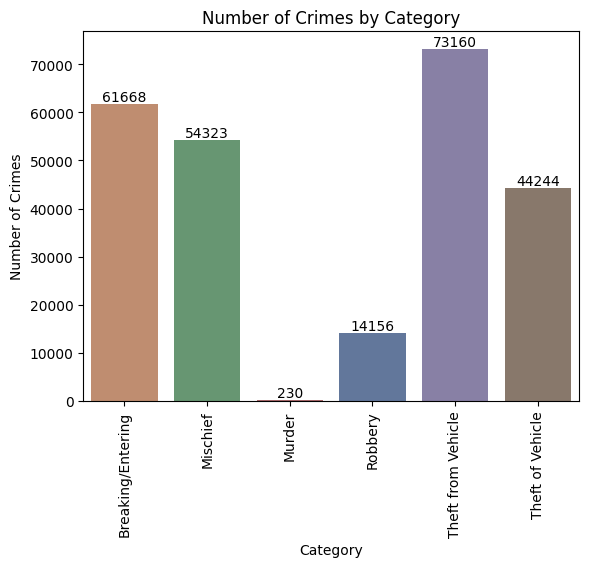

In [15]:
# Visualize counts of different types of crimes

# Group the data by category and count the number of crimes in each category
category_counts = actes.groupby('CATEGORY').size().reset_index(name='count')

color_dict = {"Breaking/Entering": "#cc8963",
          "Mischief": "#5f9e6e",
          "Murder": "#b55d60",
          "Theft from Vehicle": "#5975a4",
          "Theft of Vehicle": "#857aab",
          "Robbery": "#8d7866"}

# Create a bar plot of the category counts using seaborn
ax = sns.barplot(x='CATEGORY', y='count', data=category_counts, palette=color_dict.values())

# Add text labels to the bars
for i, v in enumerate(category_counts['count']):
    ax.text(i, v, str(v), ha='center', va='bottom')

# Rotate text
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Set the plot title and axis labels
plt.title('Number of Crimes by Category')
plt.xlabel('Category')
plt.ylabel('Number of Crimes')

# Show the plot
plt.show()


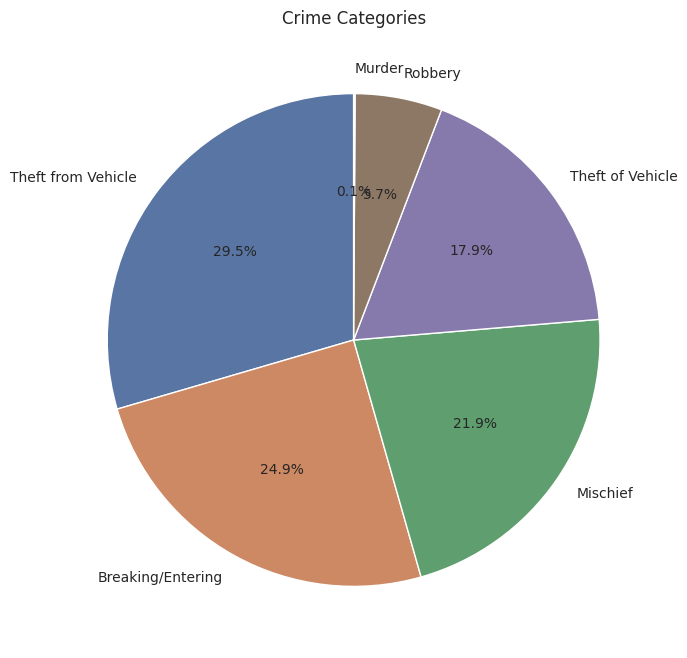

In [16]:
# Get the count of each category
category_counts = actes['CATEGORY'].value_counts()

# Plot the pie chart
sns.set_style('whitegrid')
plt.figure(figsize=(8,8))
plt.pie(category_counts.values, labels=category_counts.index, autopct='%1.1f%%', startangle=90, colors=[color_dict.get(x, '#333333ff') for x in category_counts.index])
plt.title('Crime Categories')

plt.show()

<ipython-input-17-1ecc09502e19>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


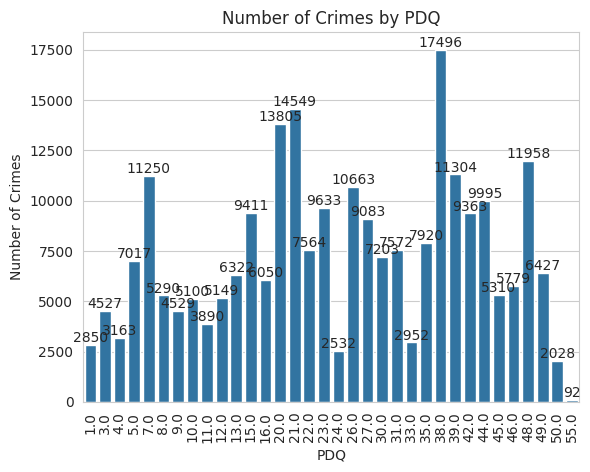

In [17]:
# Visualize counts of crime in different precincts

# Group the data by category and count the number of crimes in each category
pdq_counts = actes.groupby('PDQ').size().reset_index(name='COUNT')

# Create a bar plot of the category counts using seaborn
ax = sns.barplot(x='PDQ', y='COUNT', data=pdq_df)

# Add text labels to the bars
for i, v in enumerate(pdq_counts['COUNT']):
    ax.text(i, v, str(v), ha='center', va='bottom')

# Rotate text
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Set the plot title and axis labels
plt.title('Number of Crimes by PDQ')
plt.xlabel('PDQ')
plt.ylabel('Number of Crimes')

# Show the plot
plt.show()

<ipython-input-18-f23e85bd3649>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


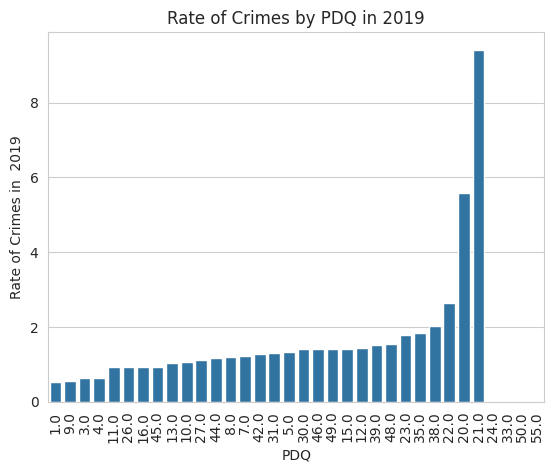

In [18]:
# Visualize rates of murder in different precincts

# Group the data by category and count the number of crimes in each category
#pdq_counts = actes.groupby('PDQ').size().reset_index(name='count')

ax = sns.barplot(x='PDQ', y='PERCENT', data=pdq_df, order=pdq_df.sort_values('PERCENT')['PDQ'])

# Rotate text
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.title('Rate of Crimes by PDQ in 2019')
plt.xlabel('PDQ')
plt.ylabel('Rate of Crimes in  2019')

plt.show()

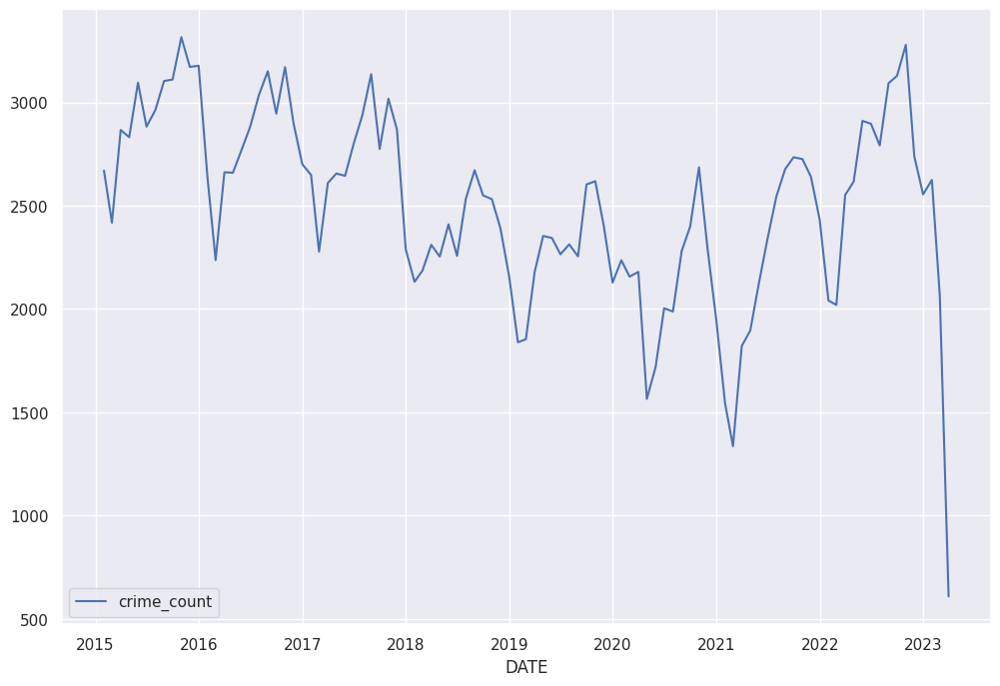

In [19]:
# All crime data graphed

# Convert to date to datetime
actes['DATE'] = pd.to_datetime(actes['DATE'])

# Group by category and count occurences; collapse date from day to month
crime_chart = actes.groupby(pd.Grouper(key='DATE', freq='M')).size().reset_index(name = 'crime_count')

# Create pivot table
crime_chart = pd.pivot_table(crime_chart, values='crime_count', index='DATE')

# Seaborn lineplot
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(12, 8)})
sns.lineplot(data = crime_chart)

plt.show()

In [20]:
# Convert to date to datetime
actes['DATE'] = pd.to_datetime(actes['DATE'])

# Analyzing trends of crime from 2014-2019 (alongside police data)
police_df = actes.groupby([pd.Grouper(key='DATE', freq='M')]).size().reset_index(name = 'crime_count')

police_df2 = police_df[(police_df['DATE'] >= "2015-01-01") & (police_df['DATE'] <= "2019-12-31")]

# Create pivot table
police_pivot = pd.pivot_table(police_df2, values='crime_count', index='DATE')
police_pivot

,crime_count
DATE,
2015-01-31,2670
2015-02-28,2418
2015-03-31,2867
2015-04-30,2832
2015-05-31,3096
2015-06-30,2883
2015-07-31,2962
2015-08-31,3104
2015-09-30,3111


<Axes: xlabel='DATE'>

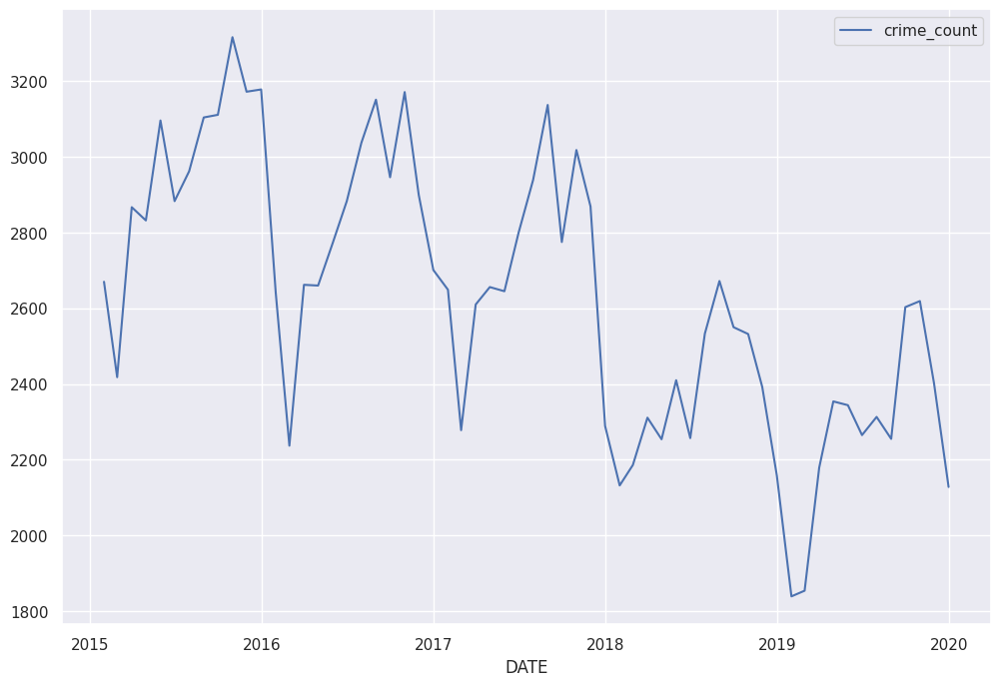

In [21]:
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(12, 8)})
sns.lineplot(data=police_pivot)

In [24]:


fig = px.choropleth_mapbox(pdq_df, geojson= limit_df,
                           color = "COUNT", # Might need to change depending on what you want to measure
                           locations="PDQ", featureidkey="properties.PDQ",
                           center={'lat': 45.508888, 'lon': -73.561668}, # Can change the coordinates to make city more centered
                           mapbox_style="carto-positron", # Another option is called "open-street-map" :o
                           color_continuous_scale='RdYlGn_r',
                           zoom=9
                           )

# .update_layout() updates the layout of the figure (includes all non-date components of the visualization)
# We are just setting the plot to take up the entire avaliable space, with no padding or spacing around the edges.
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Let's see our graph in action!
fig.show()

In [26]:

fig = px.choropleth_mapbox(pdq_df, geojson=limit_df,
                           color = "PERCENT",
                           locations="PDQ", featureidkey="properties.PDQ",
                           center={'lat': 45.508888, 'lon': -73.561668},
                           mapbox_style="carto-positron",
                           color_continuous_scale='RdYlGn_r',
                           zoom=9
                           )

# .update_layout() updates the layout of the figure (includes all non-date components of the visualization)
# We are just setting the plot to take up the entire avaliable space, with no padding or spacing around the edges.
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Let's see our graph in action!
fig.show()


In [27]:
crime_fig = px.scatter_mapbox(
        actes,
        lat="LATITUDE", lon="LONGITUDE",
        color="CATEGORY",
        mapbox_style="carto-positron",
        opacity=0.8,
        zoom=9
    )

# faint trace of precincts
pdq_fig = px.choropleth_mapbox(actes, geojson=limit_df,
                           #color = "PDQ",
                           locations="PDQ", featureidkey="properties.PDQ",
                           center={'lat': 45.508888, 'lon': -73.561668},
                           mapbox_style="carto-positron",
                           zoom=9,
                           opacity=0.4
                           )

pdq_fig = pdq_fig.update_traces(marker_line_width=2)

crime_fig.add_trace(pdq_fig.data[0])
crime_fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
crime_fig.show()


In [28]:
# Bubble Map
bubble_df = actes.groupby(['LATITUDE', 'LONGITUDE']).size().reset_index(name='COUNT')
bubble_df = bubble_df.loc[bubble_df['COUNT'] > 150]

fig = px.scatter_mapbox(bubble_df, lat = 'LATITUDE', lon = 'LONGITUDE', size = 'COUNT',
                        zoom = 8.9, mapbox_style = 'carto-positron')

fig.add_trace(pdq_fig.data[0])
fig.show()


In [29]:
actes['DATE'] = pd.to_datetime(actes['DATE'])

# Group by category and count occurences; collapse date from day to month
crime_n = actes.groupby([pd.Grouper(key='DATE', freq='M'), 'CATEGORY']).size().reset_index(name = 'crime_count')

# Create pivot table
crime_pivot = pd.pivot_table(crime_n, values='crime_count', index='DATE', columns='CATEGORY')
crime_pivot

CATEGORY,Breaking/Entering,Mischief,Murder,Robbery,Theft from Vehicle,Theft of Vehicle
DATE,,,,,,
2015-01-31,759.0,508.0,1.0,165.0,805.0,432.0
2015-02-28,768.0,429.0,5.0,146.0,707.0,363.0
2015-03-31,795.0,714.0,1.0,183.0,765.0,409.0
2015-04-30,711.0,799.0,2.0,190.0,774.0,356.0
2015-05-31,761.0,819.0,3.0,180.0,948.0,385.0
...,...,...,...,...,...,...
2022-11-30,574.0,478.0,2.0,134.0,860.0,691.0
2022-12-31,433.0,495.0,5.0,123.0,669.0,830.0
2023-01-31,515.0,424.0,1.0,154.0,665.0,866.0


<Axes: xlabel='DATE'>

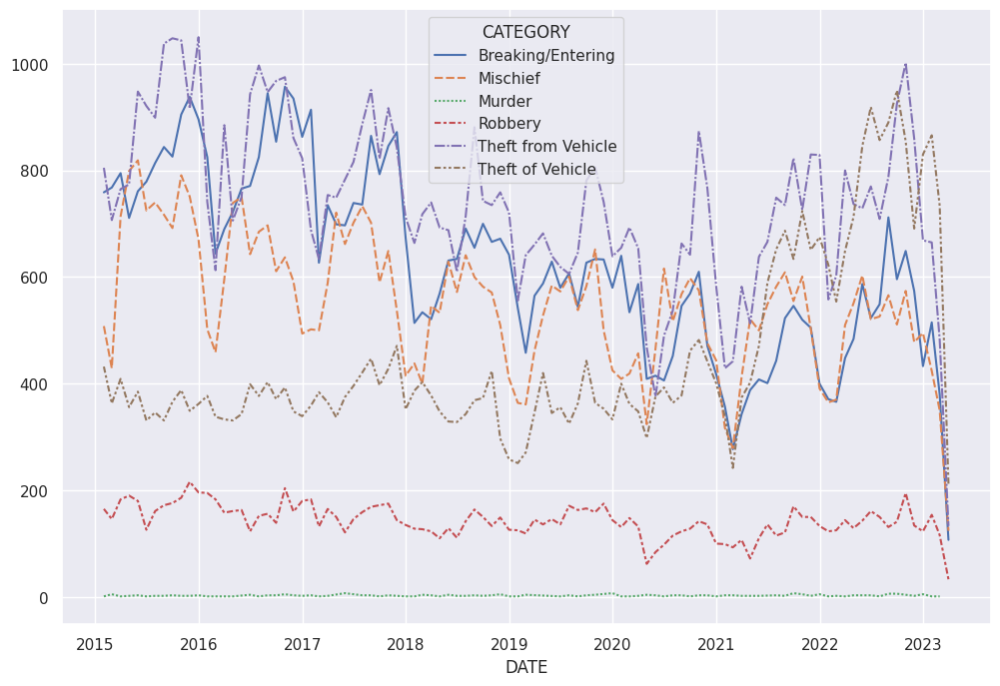

In [30]:
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(12, 8)})
sns.lineplot(data = crime_pivot)

In [31]:
murder_crime = actes[actes['CATEGORY'] == 'Murder']

# Group by category and count occurences; collapse date from day to month
crime_n2 = murder_crime.groupby([pd.Grouper(key='DATE', freq='M'), 'CATEGORY']).size().reset_index(name = 'crime_count')

# Create pivot table
crime_pivot2 = pd.pivot_table(crime_n2, values='crime_count', index='DATE', columns='CATEGORY')
crime_pivot2

CATEGORY,Murder
DATE,
2015-01-31,1
2015-02-28,5
2015-03-31,1
2015-04-30,2
2015-05-31,3
...,...
2022-10-31,4
2022-11-30,2
2022-12-31,5


<Axes: xlabel='DATE', ylabel='Murder'>

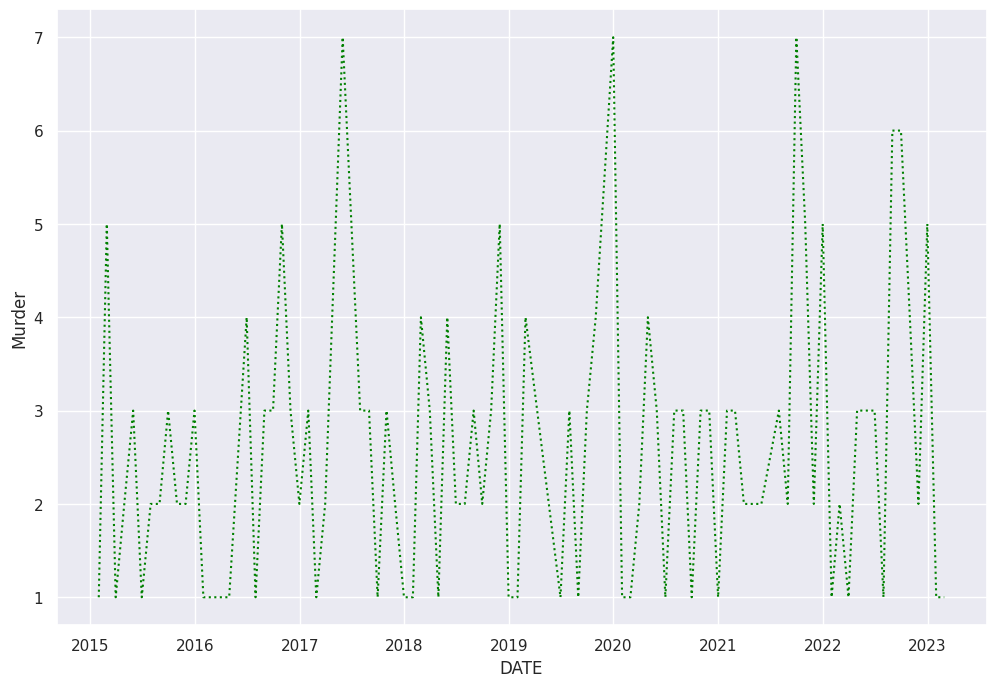

In [32]:
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(12, 8)})
sns.lineplot(x=crime_pivot2.index, y='Murder', data = crime_pivot2, linestyle = 'dotted', color='green')

In [33]:
# Filter PDQ by 24, 26
PDQ_24_26 = actes[actes['PDQ'].isin([24, 26])]

# Group by PDQ and count occurences; collapse date from day to month
crime_n3 = PDQ_24_26.groupby([pd.Grouper(key='DATE', freq='M'), 'PDQ']).size().reset_index(name = 'crime_count')

# Create pivot table
crime_pivot3 = pd.pivot_table(crime_n3, values='crime_count', index='DATE', columns='PDQ')

<Axes: xlabel='DATE'>

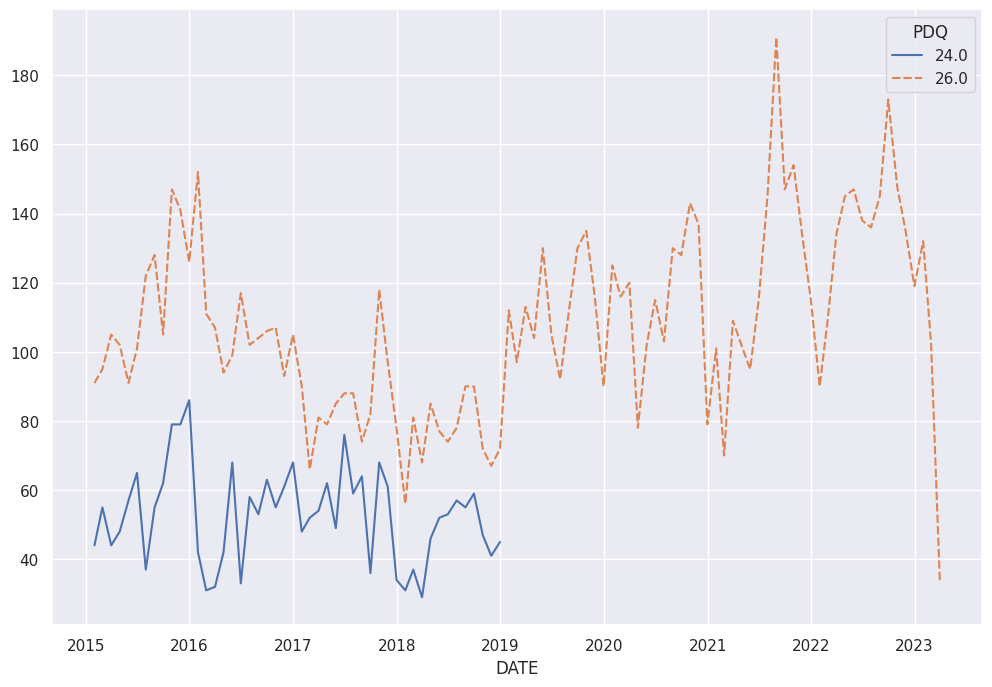

In [34]:
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(12, 8)})
sns.lineplot(data = crime_pivot3)

In [35]:
overall_by_month = actes.groupby([pd.Grouper(key='DATE', freq='M')]).size().reset_index(name = 'crime_count')

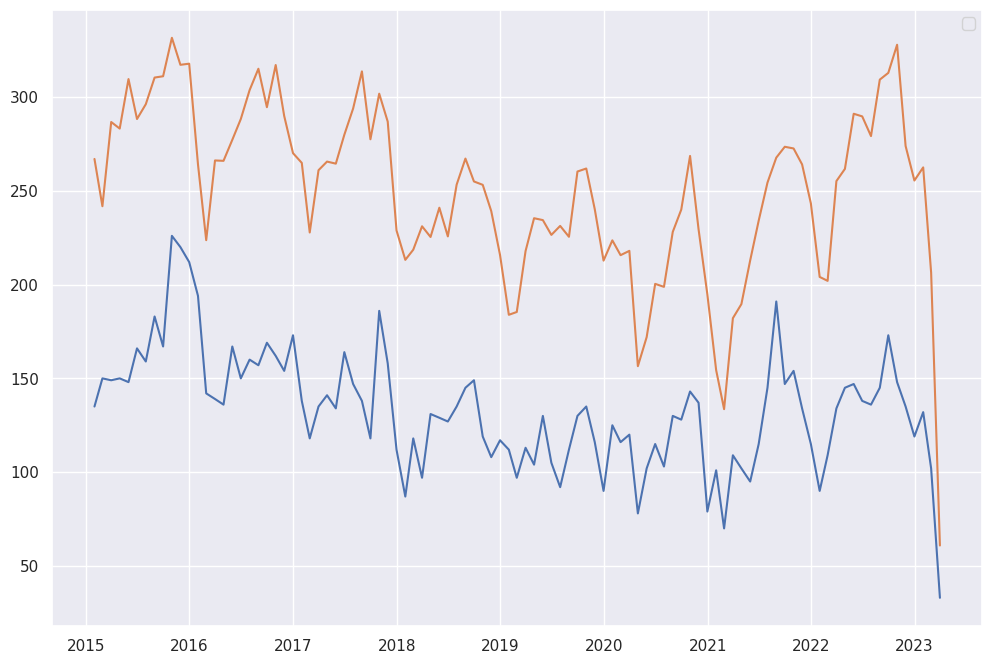

In [36]:
PDQ_24_26_by_month = PDQ_24_26.groupby([pd.Grouper(key='DATE', freq='M')]).size().reset_index(name = 'crime_count')
plt.plot(PDQ_24_26_by_month['DATE'], PDQ_24_26_by_month['crime_count'])
plt.plot(overall_by_month['DATE'], overall_by_month['crime_count'].divide(10))
plt.legend()
plt.show()

In [37]:
# Filter PDQ by 9, 11
PDQ_9_11 = actes[actes['PDQ'].isin([9, 11])]

# Group by category and count occurences; collapse date from day to month
crime_n4 = PDQ_9_11.groupby([pd.Grouper(key='DATE', freq='M'), 'PDQ']).size().reset_index(name = 'crime_count')

# Create pivot table
crime_pivot4 = pd.pivot_table(crime_n4, values='crime_count', index='DATE', columns='PDQ')

<Axes: xlabel='DATE'>

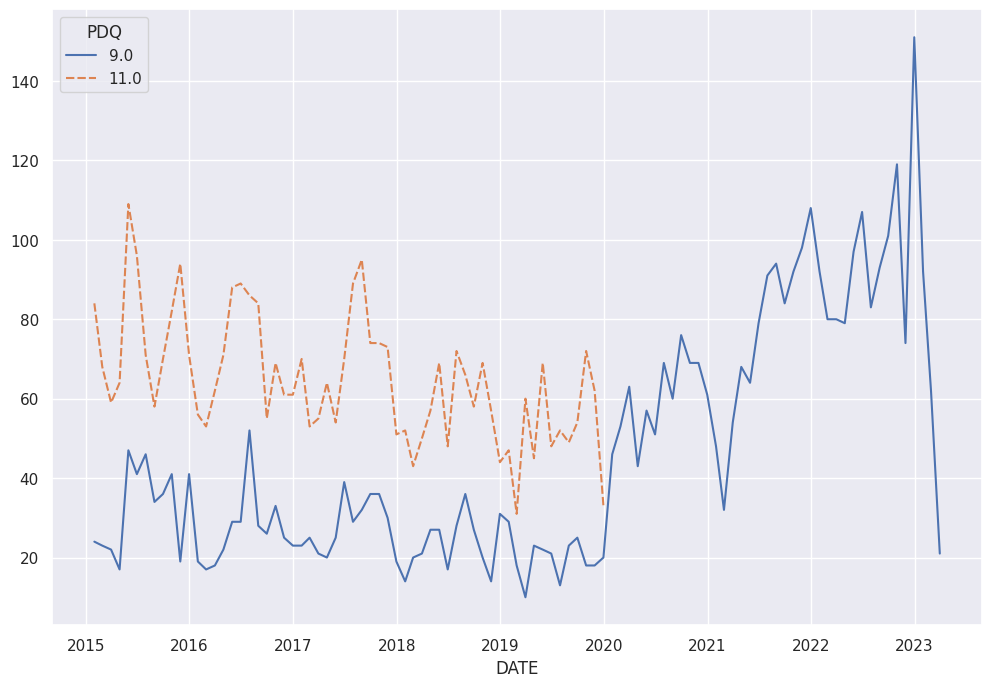

In [38]:
# Seaborn lineplot
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(12, 8)})
sns.lineplot(data = crime_pivot4)

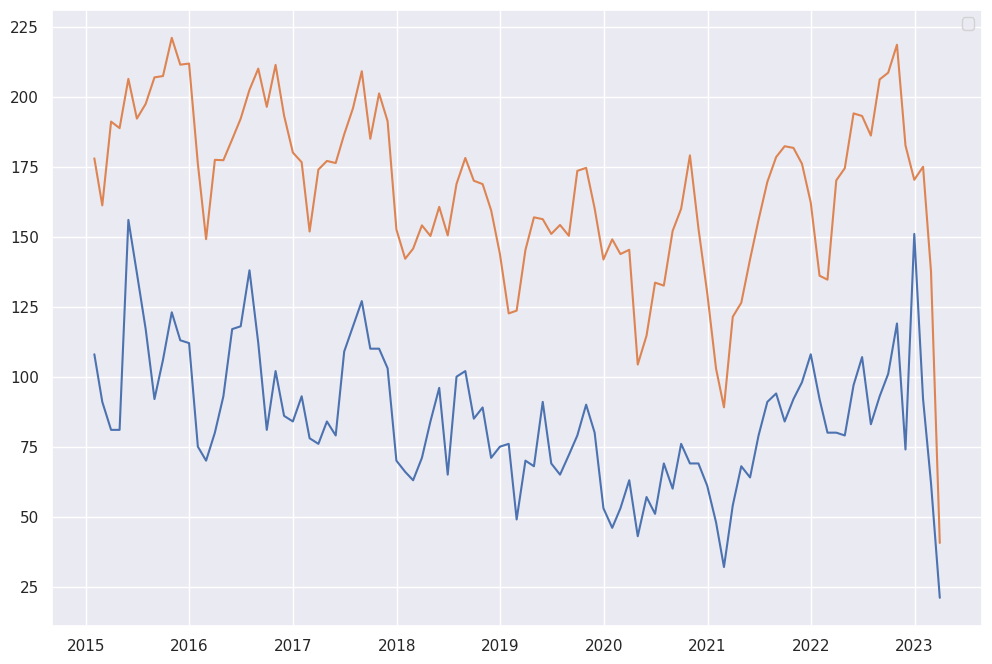

In [39]:
PDQ_9_11_by_month = PDQ_9_11.groupby([pd.Grouper(key='DATE', freq='M')]).size().reset_index(name = 'crime_count')
plt.plot(PDQ_9_11_by_month['DATE'], PDQ_9_11_by_month['crime_count'])
plt.plot(overall_by_month['DATE'], overall_by_month['crime_count'].divide(15))
plt.legend()
plt.show()

In [40]:
# Filter PDQ by 31, 33
PDQ_31_33 = actes[actes['PDQ'].isin([31, 33])]

# Group by PDQ and count occurences; collapse date from day to month
crime_n5 = PDQ_31_33.groupby([pd.Grouper(key='DATE', freq='M'), 'PDQ']).size().reset_index(name = 'crime_count')

# Create pivot table
crime_pivot5 = pd.pivot_table(crime_n5, values='crime_count', index='DATE', columns='PDQ')
crime_pivot5

PDQ,31.0,33.0
DATE,,
2015-01-31,69.0,26.0
2015-02-28,52.0,47.0
2015-03-31,91.0,76.0
2015-04-30,90.0,43.0
2015-05-31,72.0,62.0
...,...,...
2022-11-30,128.0,NaN
2022-12-31,111.0,NaN
2023-01-31,133.0,NaN


<Axes: xlabel='DATE'>

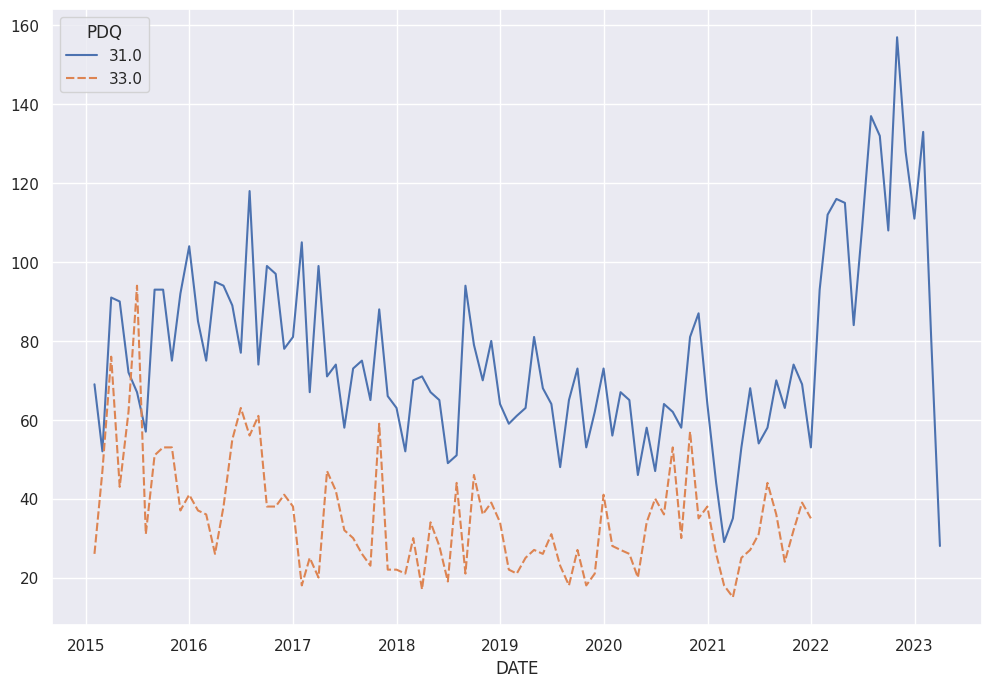

In [41]:
# Seaborn lineplot
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(12, 8)})
sns.lineplot(data = crime_pivot5)

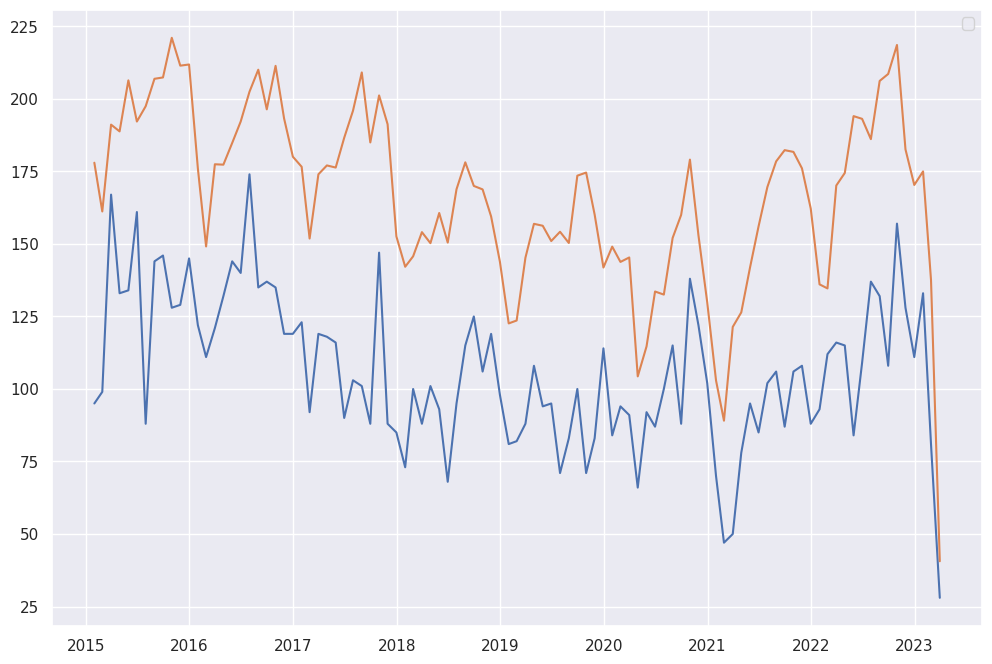

In [42]:
PDQ_31_33_by_month = PDQ_31_33.groupby([pd.Grouper(key='DATE', freq='M')]).size().reset_index(name = 'crime_count')
plt.plot(PDQ_31_33_by_month['DATE'], PDQ_31_33_by_month['crime_count'])
plt.plot(overall_by_month['DATE'], overall_by_month['crime_count'].divide(15))
plt.legend()
plt.show()

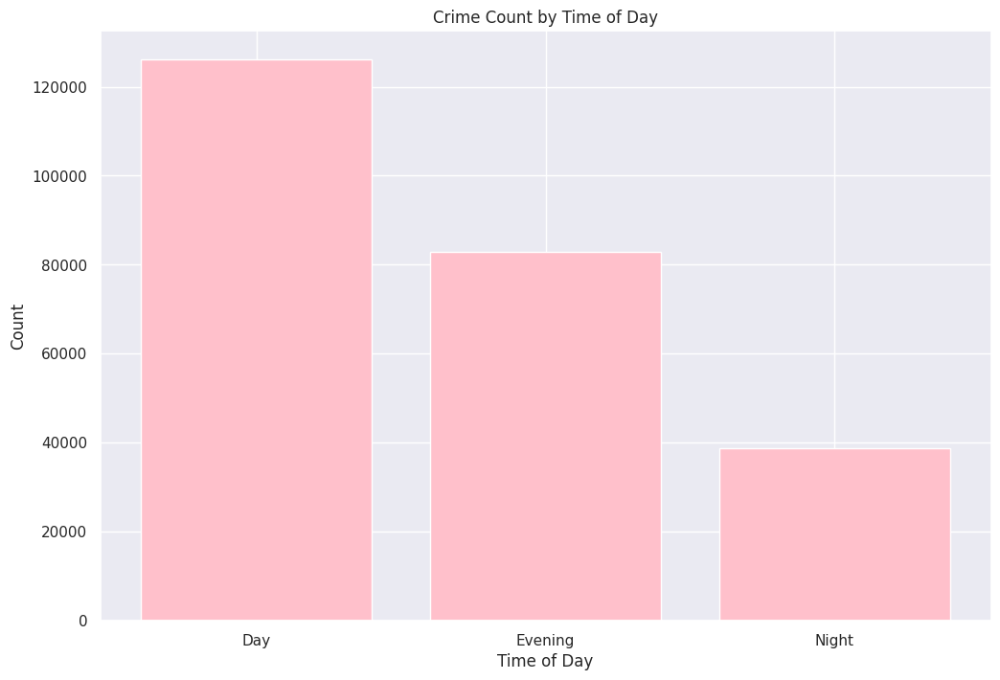

In [43]:
# Group by time of day and count occurences
time_of_day = actes.groupby('TIME OF DAY').size().reset_index(name = 'crime_count')
time_of_day

# Plot
plt.bar(time_of_day['TIME OF DAY'], time_of_day['crime_count'], color="pink")
plt.title('Crime Count by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Count')
plt.show()

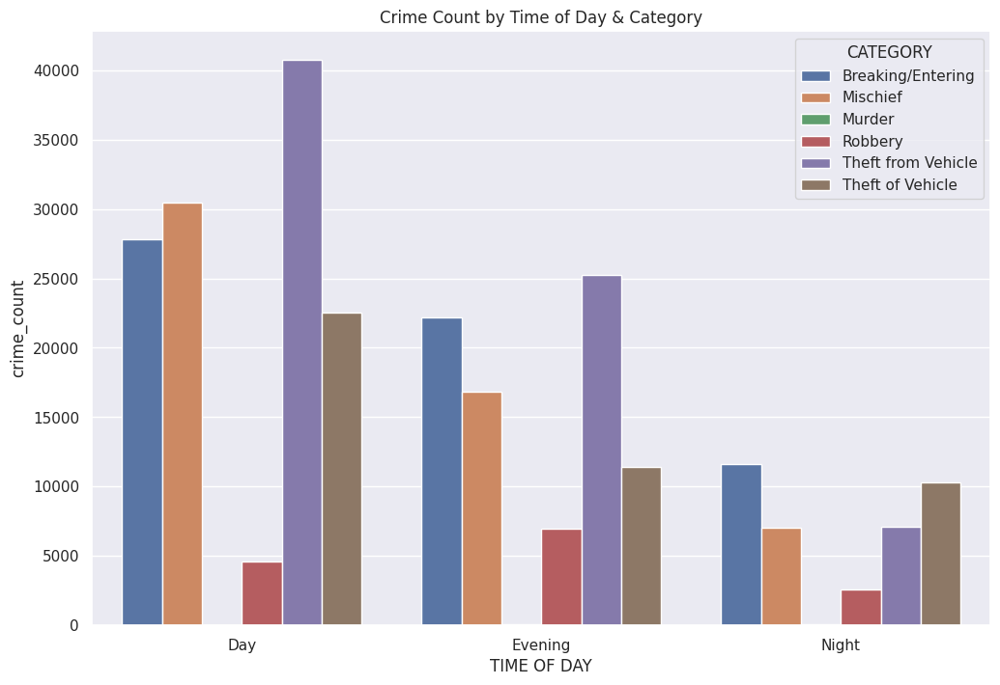

In [44]:
# Group by time of day and count occurences
time_of_day2 = actes.groupby(['TIME OF DAY', 'CATEGORY']).size().reset_index(name = 'crime_count')
time_of_day2

# Plot
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(12, 8)})
sns.barplot(data=time_of_day2, x='TIME OF DAY', y = 'crime_count', hue='CATEGORY')
plt.title('Crime Count by Time of Day & Category')
plt.show()

Text(0.5, 1.0, 'Correlation Matrix for Time of Day By Category')

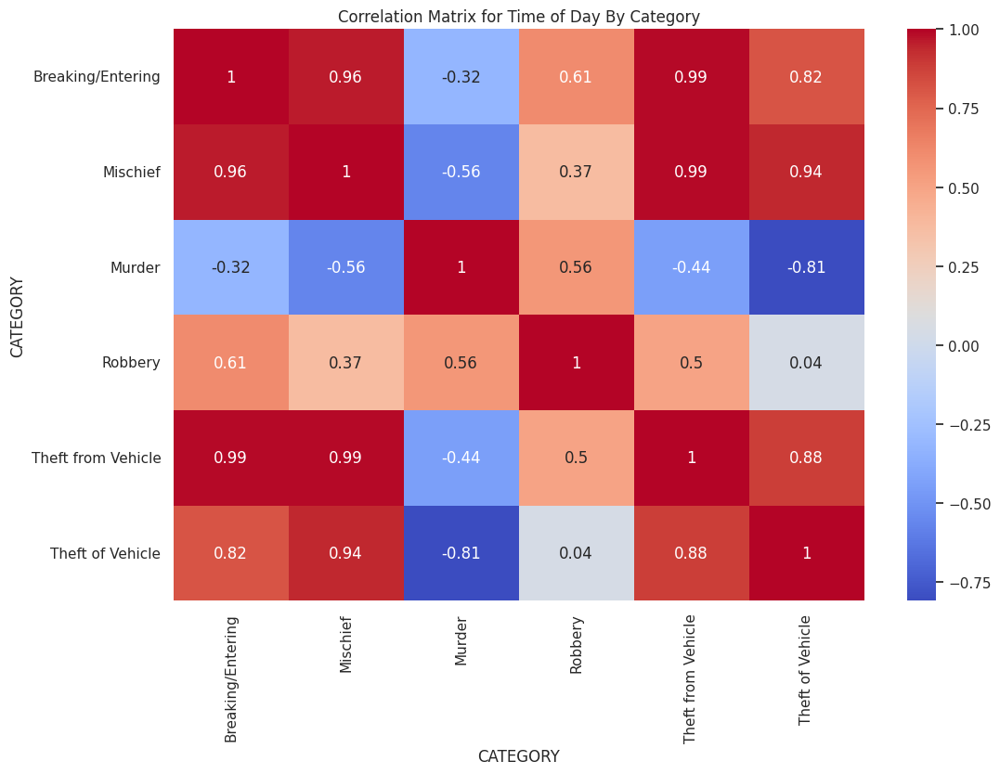

In [45]:
# Pivot dataframe w/ each category as column
tod_pivot = time_of_day2.pivot(index='TIME OF DAY', columns='CATEGORY', values='crime_count')

# Correlation matrix
tod_corr_matrix = tod_pivot.corr()

# Plot
sns.heatmap(tod_corr_matrix, cmap='coolwarm', annot=True)

plt.title('Correlation Matrix for Time of Day By Category')

In [46]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras.layers import LSTM
from keras.layers import Dense
from keras.models import Sequential
from matplotlib import pyplot
import torch.nn as nn
import torch
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, LogisticRegression
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

In [49]:
crime_n['YEAR'] = crime_n['DATE'].apply(lambda x: int(x.strftime("%Y")))
crime_n['MONTH'] = crime_n['DATE'].apply(lambda x: int(x.strftime("%m")))

In [48]:
# Group by category and count occurences; collapse date from day to month
crime_n = actes.groupby([pd.Grouper(key='DATE', freq='M')]).size().reset_index(name = 'crime_count')
crime_n = crime_n[crime_n["DATE"] != "2023-03-31"]
crime_n

,DATE,crime_count
0,2015-01-31,2670
1,2015-02-28,2418
2,2015-03-31,2867
3,2015-04-30,2832
4,2015-05-31,3096
...,...,...
93,2022-10-31,3279
94,2022-11-30,2739
95,2022-12-31,2555
96,2023-01-31,2625


In [50]:
crime_n = crime_n.drop(columns=['DATE'])

In [51]:
train = crime_n.iloc[:90, :]
test = crime_n.iloc[90:, ]

In [52]:
X_train, y_train = train[['YEAR', 'MONTH']], train['crime_count']
X_test, y_test = test[['YEAR', 'MONTH']], test['crime_count']

X_train = torch.from_numpy(X_train.values).float()
X_test = torch.from_numpy(X_test.values).float()
y_train = torch.from_numpy(y_train.values).float()
y_test = torch.from_numpy(y_test.values).float()

In [53]:
model = XGBRegressor(max_depth=3)
model.fit(X_train, y_train)
y_hat_test = model.predict(X_test)
score = mean_squared_error(y_hat_test, y_test)
score

67493.09

In [54]:
data = []
for i in range(2023, 2024):
    for j in range(1,13):
        data.append([i, j])

In [55]:
X_eval = pd.DataFrame(data, columns=['YEAR', 'MONTH'])
X_eval

,YEAR,MONTH
0,2023,1
1,2023,2
2,2023,3
3,2023,4
4,2023,5
5,2023,6
6,2023,7
7,2023,8
8,2023,9
9,2023,10


In [56]:
y_hat_eval = model.predict(X_eval)
y_hat_eval

array([2043.8489, 2003.0298, 2552.2932, 2616.8345, 2893.4849, 2928.5688,
       3040.906 , 2980.5315, 3034.5376, 3057.5461, 2938.523 , 2716.5952],
      dtype=float32)

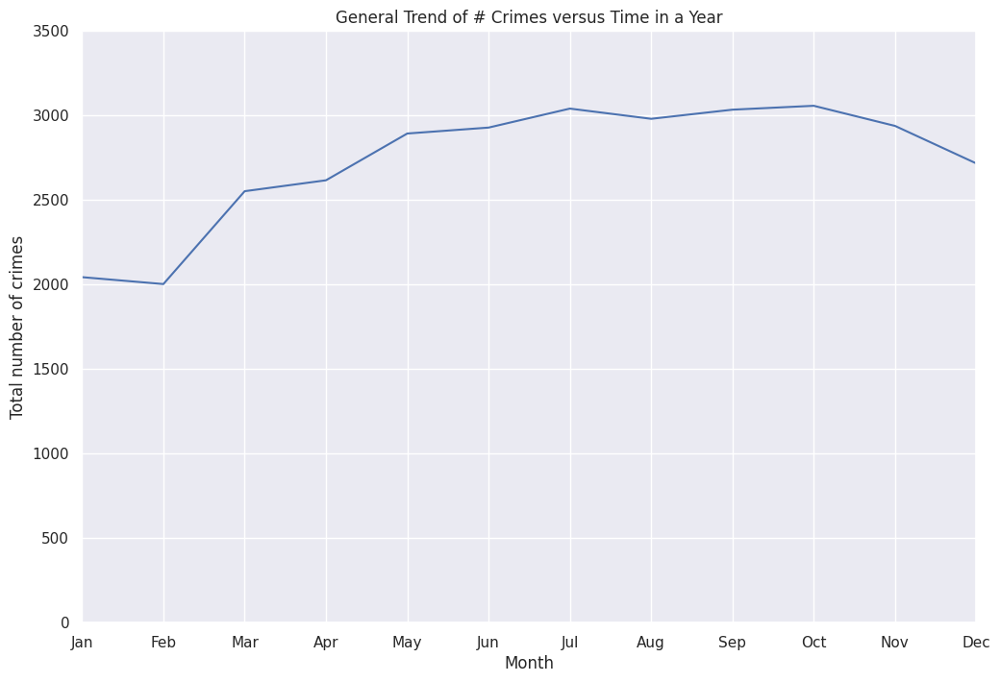

In [57]:
# plt.plot(range(278), np.concatenate((y_train, y_hat_test)))
plt.plot(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], y_hat_eval)
plt.axis([0, 11, 0, 3500])
plt.xlabel('Month')
plt.ylabel('Total number of crimes')
plt.title('General Trend of # Crimes versus Time in a Year')
plt.show()

0  /  247781


NameError: name 'memo' is not defined

In [60]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras.layers import LSTM
from keras.layers import Dense
from keras.models import Sequential
from matplotlib import pyplot

In [61]:
# Remove unnecessary columns
actes = actes.drop(['X', 'Y'], axis=1)
actes

,CATEGORY,DATE,TIME OF DAY,PDQ,LONGITUDE,LATITUDE
0,Theft of Vehicle,2018-09-13,Day,30.0,-73.626778,45.567780
1,Theft of Vehicle,2018-04-30,Day,30.0,-73.626778,45.567780
2,Theft of Vehicle,2018-09-01,Night,7.0,-73.685928,45.519122
3,Mischief,2017-07-21,Day,21.0,NaN,NaN
4,Mischief,2017-07-29,Day,12.0,NaN,NaN
...,...,...,...,...,...,...
247776,Mischief,2023-01-25,Night,5.0,-73.787533,45.482397
247777,Theft of Vehicle,2023-01-25,Night,27.0,NaN,NaN
247778,Theft from Vehicle,2023-01-25,Night,7.0,-73.718913,45.505551
247779,Murder,2023-01-25,Night,22.0,-73.558643,45.532059


In [62]:
nan_rows = actes[actes.isnull().any(axis=1)]
nan_rows

,CATEGORY,DATE,TIME OF DAY,PDQ,LONGITUDE,LATITUDE
3,Mischief,2017-07-21,Day,21.0,NaN,NaN
4,Mischief,2017-07-29,Day,12.0,NaN,NaN
5,Theft of Vehicle,2017-07-30,Night,21.0,NaN,NaN
7,Robbery,2017-07-30,Day,21.0,NaN,NaN
9,Mischief,2017-08-01,Day,21.0,NaN,NaN
...,...,...,...,...,...,...
247765,Theft of Vehicle,2023-01-24,Evening,20.0,NaN,NaN
247768,Theft of Vehicle,2023-01-24,Evening,20.0,NaN,NaN
247769,Theft of Vehicle,2023-01-25,Night,13.0,NaN,NaN
247777,Theft of Vehicle,2023-01-25,Night,27.0,NaN,NaN


In [63]:
actes.dropna(inplace=True)

In [64]:
actes['DATE'] = pd.to_datetime(actes['DATE'])

In [65]:
# Group by category and count occurences; collapse date from day to month
rest = actes[['TIME OF DAY', 'PDQ', 'LONGITUDE', "LATITUDE"]]

crime_n = actes.groupby([pd.Grouper(key='DATE', freq='M'), 'CATEGORY']).size().reset_index(name = 'crime_count')
crime_n = pd.merge(crime_n, rest, left_index=True, right_index=True)
crime_n

,DATE,CATEGORY,crime_count,TIME OF DAY,PDQ,LONGITUDE,LATITUDE
0,2015-01-31,Breaking/Entering,737,Day,30.0,-73.626778,45.567780
1,2015-01-31,Mischief,409,Day,30.0,-73.626778,45.567780
2,2015-01-31,Murder,1,Night,7.0,-73.685928,45.519122
6,2015-02-28,Breaking/Entering,741,Day,38.0,-73.591457,45.516776
8,2015-02-28,Murder,5,Day,39.0,-73.635117,45.602873
...,...,...,...,...,...,...,...
570,2023-03-31,Breaking/Entering,101,Night,20.0,-73.567745,45.505374
571,2023-03-31,Mischief,110,Day,20.0,-73.567745,45.505374
572,2023-03-31,Robbery,30,Evening,20.0,-73.567745,45.505374
573,2023-03-31,Theft from Vehicle,103,Day,20.0,-73.567745,45.505374


In [66]:
crime_n['PDQ'] = crime_n['PDQ'].astype(object)
crime_n

,DATE,CATEGORY,crime_count,TIME OF DAY,PDQ,LONGITUDE,LATITUDE
0,2015-01-31,Breaking/Entering,737,Day,30.0,-73.626778,45.567780
1,2015-01-31,Mischief,409,Day,30.0,-73.626778,45.567780
2,2015-01-31,Murder,1,Night,7.0,-73.685928,45.519122
6,2015-02-28,Breaking/Entering,741,Day,38.0,-73.591457,45.516776
8,2015-02-28,Murder,5,Day,39.0,-73.635117,45.602873
...,...,...,...,...,...,...,...
570,2023-03-31,Breaking/Entering,101,Night,20.0,-73.567745,45.505374
571,2023-03-31,Mischief,110,Day,20.0,-73.567745,45.505374
572,2023-03-31,Robbery,30,Evening,20.0,-73.567745,45.505374
573,2023-03-31,Theft from Vehicle,103,Day,20.0,-73.567745,45.505374


In [67]:
y = crime_n.crime_count
y

0      737
1      409
2        1
6      741
8        5
      ... 
570    101
571    110
572     30
573    103
574    169
Name: crime_count, Length: 512, dtype: int64

In [68]:
# Leave date untouched (acts like an index)
features = ['CATEGORY', 'TIME OF DAY', 'PDQ', 'LONGITUDE', 'LATITUDE']
X = crime_n[['DATE']+features]
X

,DATE,CATEGORY,TIME OF DAY,PDQ,LONGITUDE,LATITUDE
0,2015-01-31,Breaking/Entering,Day,30.0,-73.626778,45.567780
1,2015-01-31,Mischief,Day,30.0,-73.626778,45.567780
2,2015-01-31,Murder,Night,7.0,-73.685928,45.519122
6,2015-02-28,Breaking/Entering,Day,38.0,-73.591457,45.516776
8,2015-02-28,Murder,Day,39.0,-73.635117,45.602873
...,...,...,...,...,...,...
570,2023-03-31,Breaking/Entering,Night,20.0,-73.567745,45.505374
571,2023-03-31,Mischief,Day,20.0,-73.567745,45.505374
572,2023-03-31,Robbery,Evening,20.0,-73.567745,45.505374
573,2023-03-31,Theft from Vehicle,Day,20.0,-73.567745,45.505374


In [69]:
# Label encode
le = LabelEncoder()

cat_cols = ['CATEGORY', 'TIME OF DAY', 'PDQ']

for i in cat_cols:
    if X[i].dtype == 'object':
        X[i] = le.fit_transform(X[i])

X.head(5)

<ipython-input-69-5adcc3034580>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-69-5adcc3034580>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-69-5adcc3034580>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,DATE,CATEGORY,TIME OF DAY,PDQ,LONGITUDE,LATITUDE
0,2015-01-31,0,0,20,-73.626778,45.567780
1,2015-01-31,1,0,20,-73.626778,45.567780
2,2015-01-31,2,2,4,-73.685928,45.519122
6,2015-02-28,0,0,24,-73.591457,45.516776
8,2015-02-28,2,0,25,-73.635117,45.602873


In [70]:
# # Standard transformation
ss = StandardScaler()

for i in features:
    if X[i].dtype == 'int64' or X[i].dtype == 'float64':
        X[i] = ss.fit_transform(X[i].to_numpy().reshape(-1,1))

X2 = pd.DataFrame(X)
X2.head(5)

<ipython-input-70-d569c1ec8c1e>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-d569c1ec8c1e>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-d569c1ec8c1e>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-d569c1e

,DATE,CATEGORY,TIME OF DAY,PDQ,LONGITUDE,LATITUDE
0,2015-01-31,-1.443756,-0.942693,0.376097,-0.020908,0.701631
1,2015-01-31,-0.867155,-0.942693,0.376097,-0.020908,0.701631
2,2015-01-31,-0.290553,1.753725,-1.373471,-0.804962,-0.249027
6,2015-02-28,-1.443756,-0.942693,0.813490,0.447284,-0.294862
8,2015-02-28,-0.290553,-0.942693,0.922838,-0.131444,1.387262


In [71]:
# 60-20-20% Distribution
train_X, test_X, train_y, test_y = train_test_split(X2, y, test_size=0.2, random_state=42)

train_X, val_X, train_y, val_y = train_test_split(train_X, train_y, test_size=0.2, random_state=42)

print(f'No. of training sets: {train_X.shape[0]}')
print(f'No. of validation sets: {val_X.shape[0]}')
print(f'No. of testing sets: {test_X.shape[0]}')

No. of training sets: 327
No. of validation sets: 82
No. of testing sets: 103


In [72]:

train_X = train_X.values.reshape((train_X.shape[0], 6, 1))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(327, 6, 1) (327,) (103, 6) (103,)


In [73]:
lstm_model = tf.keras.models.Sequential()
lstm_model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
lstm_model.add(Dense(1))
lstm_model.compile(loss='mae', optimizer='adam')

#Compile the model
lstm_model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

#Print the model summary
lstm_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 50)                10400     
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 10451 (40.82 KB)
Trainable params: 10451 (40.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [82]:
train_X

array([[[1640908800.0],
        [-0.2905530687156581],
        [0.40551598212624296],
        [-0.6080349329822397],
        [0.5598222457514908],
        [-0.9895192238891161]],

       [[1656547200.0],
        [1.4392512473589576],
        [0.40551598212624296],
        [0.15740138588265212],
        [0.08186086786272394],
        [-0.5352517303623192]],

       [[1617148800.0],
        [-0.2905530687156581],
        [1.7537249616628428],
        [0.2667494314347795],
        [-0.45944782338055545],
        [0.29511353316963507]],

       ...,

       [[1448841600.0],
        [-0.2905530687156581],
        [-0.942692997410357],
        [-1.4828192973992587],
        [-2.078310353753358],
        [-0.9144364327134733]],

       [[1469923200.0],
        [-0.8671545074071966],
        [0.40551598212624296],
        [0.4854455225390343],
        [0.04181645822813619],
        [0.35128397933915895]],

       [[1677542400.0],
        [0.862649808667419],
        [-0.942692997410357],
     

In [81]:
# Convert Timestamp to tensor
import torch

i = 0
for a in train_X:
    unix_time = a[0][0].timestamp()
    train_X[i][0] = unix_time
    i += 1

print(train_X)

AttributeError: 'float' object has no attribute 'timestamp'

In [83]:
# Convert Timestamp to tensor
import torch

i = 0
for a in test_X:
    unix_time2 = a[0][0].timestamp()
    test_X[i][0] = unix_time2
    i += 1

print(test_X)

AttributeError: 'str' object has no attribute 'timestamp'

In [84]:
train_X2 = train_X.astype(np.float32)
print(train_X2)

[[[ 1.6409088e+09]
  [-2.9055306e-01]
  [ 4.0551597e-01]
  [-6.0803491e-01]
  [ 5.5982226e-01]
  [-9.8951924e-01]]

 [[ 1.6565472e+09]
  [ 1.4392513e+00]
  [ 4.0551597e-01]
  [ 1.5740138e-01]
  [ 8.1860870e-02]
  [-5.3525174e-01]]

 [[ 1.6171488e+09]
  [-2.9055306e-01]
  [ 1.7537249e+00]
  [ 2.6674944e-01]
  [-4.5944783e-01]
  [ 2.9511353e-01]]

 ...

 [[ 1.4488416e+09]
  [-2.9055306e-01]
  [-9.4269300e-01]
  [-1.4828193e+00]
  [-2.0783103e+00]
  [-9.1443646e-01]]

 [[ 1.4699232e+09]
  [-8.6715448e-01]
  [ 4.0551597e-01]
  [ 4.8544553e-01]
  [ 4.1816458e-02]
  [ 3.5128397e-01]]

 [[ 1.6775424e+09]
  [ 8.6264980e-01]
  [-9.4269300e-01]
  [ 7.0414162e-01]
  [ 4.7018957e-01]
  [ 1.5799904e-01]]]


In [87]:
history = lstm_model.fit(train_X2, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y))

Epoch 1/50
5/5 [==============================] - ETA: 0s - loss: 181692.0781 - accuracy: 0.0000e+00 

ValueError: Failed to convert a NumPy array to a Tensor (Unsupported object type Timestamp).

TypeError: Cannot cast DatetimeArray to dtype float32